# ASCII art

###### ASCII Art Using Robert Heaton's Method

In this notebook, I am exploring ASCII art using a method outlined by Robert Heaton in his informative blog post about programming projects for advanced beginners. You can find the original article [here](https://robertheaton.com/2018/06/12/programming-projects-for-advanced-beginners-ascii-art/).

Robert Heaton's approach to ASCII art provides valuable insights into creating visually interesting and engaging text-based art. Let's dive into the code and see how we can implement his ideas.

References:
- Robert Heaton's Blog: [Programming Projects for Advanced Beginners - ASCII Art](https://robertheaton.com/2018/06/12/programming-projects-for-advanced-beginners-ascii-art/)

I'm embarking on a project to create a program that transforms images into captivating ASCII art. The captivating yet rudimentary form of art, known as ASCII, traces its origins back to the Sumerians in 4000 BCE. This form of art involves printing characters to the terminal in a manner that recreates the contours of the original image.

The project is structured into five distinct sections, with the final output of the ASCII picture being produced after completing the fifth step.

At the conclusion of each step, I'll encounter a section of intermediate output. This output serves as a checkpoint to ensure that everything appears coherent before proceeding to the subsequent section. This method of verifying smaller portions of code step by step is crucial in confirming the correctness of my progress.

As I make my way through this project, additional opportunities will arise to enhance the capabilities of my ASCII art generator. These extensions will bring vivid and vibrant colors to the pictures. Moreover, you too can contribute your own enhancements to the project.

### 0. Choose an image

A JPEG image essentially consists of a grid composed of individual pixels. If you were to magnify the image significantly, the individual pixels would become visible.

You can view an example of an ASCII image by following this [link](https://robertheaton.com/images/ascii-pixellated-pineapple.jpg).

In my ASCII art endeavor, I will symbolize each of these pixels with a corresponding ASCII character. When considering a dark terminal background with white text, pixels of darker shades will be depicted using smaller characters such as a dot (.), which allows more of the dark terminal background to show through. On the other hand, pixels of brighter shades will be represented by denser characters like $, which effectively fill the screen with white text.

To begin, select the initial image you wish to convert into ASCII art. It's advantageous to opt for an image that is approximately 640x480 pixels in size, as this choice will become clear later in the process. As a suggestion, you might want to use an image of a pineapple relaxing on a beach for your initial conversion.

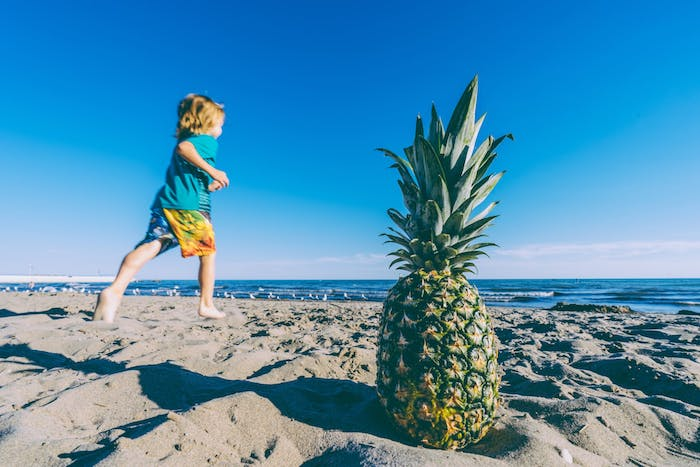

### 1. Read your image and print its height and width in pixels

Begin by identifying and installing an appropriate image processing library. The selection of the library depends on the programming language you're using. As of 2018, most libraries should have well-documented installation instructions. If you encounter difficulties due to inadequate instructions, don't be discouraged – simply move on to another library.

Here are some suggestions for various programming languages along with installation instructions:

- For Python, I recommend using Pillow, which is known for its user-friendly nature. Install it via pip, the Python package manager:
  ```
  pip install Pillow
  ```

- If you're working with Ruby, consider MiniMagick. Install it using the gem package manager:
  ```
  gem install mini_magick
  ```

- For JavaScript, explore CamanJS. You can include it in your project by linking to the appropriate script in your HTML file.

- If you're using a different programming language, search for an ImageMagick wrapper library or look into popular choices within the community.

Once you've successfully installed the chosen library, start by using it to read your image file. This task can be accomplished in just a couple of lines of code. Loading your image and printing its dimensions will serve as an initial test to verify correct library installation and help you become acquainted with its documentation.

By the end of this section, your program's output should resemble the following:

```
Image successfully loaded!
Image size: 640 x 480
```

Remember to replace the placeholders with the actual library names, commands, and specific instructions based on your chosen programming language.

In [5]:
from PIL import Image

# Load and read the image
image_path = 'ascii-pineapple.jpg'
img = Image.open(image_path)

# Get image dimensions
image_width, image_height = img.size

# Print the output
print("Image successfully loaded!")
print(f"Image size: {image_width} x {image_height}")


Image successfully loaded!
Image size: 700 x 467


### Step 2: Let's Dive into Loading and Organizing Pixel Data

As I delve further into the world of image processing, it's time to learn about loading and managing pixel data in my images. In image processing libraries, such as the one we're using, a pixel within a JPEG image is represented by something called a *tuple*. Now, think of a tuple as a concept similar to a list or an array, but with a specific twist.

This tuple contains three numbers, each ranging from 0 to 255, and it describes the amount of Red, Green, and Blue present in that particular pixel. For instance, it could look like this: `(76, 54, 121)`. Remember, these three primary colors of light—Red, Green, and Blue—can be mixed in varying proportions to create an entire spectrum of colors that we see around us.

Now, as I move on from loading the image, the next logical step is to read all these tuples, which essentially represent each and every pixel in your image. I'm then going to organize them neatly into what's known as a 2-dimensional array. To give you a mental image, think of this as an array of arrays, often referred to as a *matrix*. This structure is particularly useful when dealing with grid-like data, just like the matrix of pixels in our images. Each tuple is much like a mini data package that holds the essence of a pixel's color. It's akin to opening a treasure chest filled with color secrets.

Let's take a look at how this works practically:

In [16]:
# Load your image using the library (this is step 1)
from PIL import Image

# Evoke the image 
image_path = 'ascii-pineapple.jpg'
img = Image.open(image_path)

# Create an empty 2D array to store pixel tuples
pixel_matrix = []

# Loop through each row in the image
for y in range(img.height):
    row = []
    # Loop through each pixel in the row
    for x in range(img.width):
        pixel_tuple = img.getpixel((x, y)) # Get the pixel tuple
        row.append(pixel_tuple) # Append to the row
    pixel_matrix.append(row)  # Append the row to the matrix
#     print(pixel_matrix)

Or you can attempt to use this code

In [18]:
from PIL import Image

# Load your image
image_path = 'ascii-pineapple.jpg'
img = Image.open(image_path)

# Extract pixel data
pixel_data = list(img.getdata())

# Create a 2D array (matrix)
image_width, image_height = img.size
pixel_matrix = [pixel_data[i:i + image_width] for i in range(0, len(pixel_data), image_width)]

# # Print the pixel data in the 2D array
# for row in pixel_matrix:
#     print(row)


Remember, in the code above, `'ascii-pineapple.jpg'` should be replaced with the actual path to your image file. This code takes us one step closer to mastering the art of pixel manipulation.

Here's a visual representation of what this matrix could look like:

In [3]:
# A 2-dimensional array of pixels:
[
  [(255,45,19), (44,44,92), (80,1,9), ...],
  [(51,2,231), (61,149,14), (234,235,211), ...],
  [(51,2,231), (61,149,14), (199,102,202)...],
  [(51,2,231), (61,149,14), (1,5,42)...],
  ...
]

SyntaxError: invalid syntax (306447679.py, line 5)

With my pixel data now comfortably nestled within a 2-dimensional array, I can access any pixel's information using its x, y coordinates, like `pixel_matrix[x][y`]. It's as if each pixel's data resides in a designated room of the array mansion.

To explore this data, I can use nested loops like the following:

In [27]:
for x in range(len(pixel_matrix)):
    for y in range(len(pixel_matrix[x])):
        pixel = pixel_matrix[x][y]
        # Now I can perform actions with the pixel...
    print(pixel)

(3, 133, 217)
(3, 133, 217)
(3, 133, 217)
(3, 133, 217)
(2, 134, 217)
(2, 134, 217)
(2, 134, 217)
(2, 134, 217)
(2, 134, 217)
(3, 135, 218)
(1, 136, 218)
(1, 136, 218)
(2, 137, 219)
(2, 137, 219)
(2, 137, 219)
(3, 138, 220)
(1, 138, 219)
(1, 138, 219)
(1, 138, 219)
(2, 139, 220)
(2, 139, 220)
(2, 139, 220)
(3, 140, 220)
(3, 140, 220)
(0, 140, 219)
(0, 140, 219)
(0, 140, 219)
(1, 141, 220)
(1, 141, 218)
(2, 142, 219)
(1, 143, 219)
(1, 143, 219)
(1, 142, 221)
(2, 143, 222)
(2, 143, 222)
(2, 143, 222)
(2, 145, 223)
(2, 145, 223)
(2, 145, 223)
(3, 146, 224)
(3, 146, 224)
(3, 146, 224)
(1, 147, 224)
(1, 147, 224)
(1, 147, 224)
(1, 147, 224)
(1, 147, 224)
(1, 147, 224)
(0, 148, 222)
(0, 148, 222)
(0, 148, 222)
(1, 149, 223)
(1, 149, 223)
(2, 150, 224)
(2, 150, 224)
(2, 150, 224)
(0, 151, 224)
(1, 152, 225)
(1, 152, 225)
(1, 152, 225)
(2, 153, 226)
(2, 153, 226)
(1, 153, 226)
(2, 154, 227)
(1, 153, 226)
(2, 154, 227)
(2, 154, 227)
(2, 154, 227)
(2, 156, 226)
(2, 156, 226)
(2, 156, 226)
(2, 15

Some image processing libraries might offer a convenient method that performs the task of loading pixel data into a 2-dimensional array directly. If such a method is available, I'll certainly use it. If not, I'll gather insights from the available methods and resources online. Search engines like Google are my trusty companions in such quests.

As I conclude this section, my program should echo additional output resembling:

``` python
Pixel matrix construction successful!
Pixel matrix dimensions: 640 x 480
Exploring pixel contents:
(255, 255, 255)
(10, 64, 172)
# … and so on for many lines.
# I'll remove or comment out this debug code once I confirm its functionality.

```

In [28]:
# Print pixel matrix information
print("Pixel matrix construction successful!")
print(f"Pixel matrix dimensions: {image_width} x {image_height}")

# Explore pixel contents
print("Exploring pixel contents:")
for row in pixel_matrix:
    for pixel in row:
        print(pixel)

Pixel matrix construction successful!
Pixel matrix dimensions: 700 x 467
Exploring pixel contents:
(1, 116, 209)
(1, 116, 209)
(1, 116, 209)
(1, 116, 209)
(1, 116, 209)
(1, 116, 209)
(1, 116, 209)
(1, 116, 209)
(1, 116, 209)
(1, 116, 209)
(1, 116, 209)
(1, 116, 209)
(1, 116, 209)
(1, 116, 209)
(1, 116, 209)
(1, 116, 209)
(2, 115, 207)
(2, 115, 207)
(2, 115, 207)
(2, 115, 207)
(2, 115, 207)
(2, 115, 207)
(2, 115, 207)
(2, 115, 207)
(0, 113, 205)
(0, 113, 205)
(0, 113, 205)
(0, 113, 205)
(0, 113, 205)
(0, 113, 205)
(0, 113, 205)
(0, 113, 205)
(1, 112, 204)
(1, 112, 204)
(1, 112, 204)
(1, 112, 204)
(1, 112, 204)
(1, 112, 204)
(1, 112, 204)
(1, 112, 204)
(1, 112, 204)
(1, 112, 204)
(1, 112, 204)
(1, 112, 204)
(1, 112, 204)
(1, 112, 204)
(1, 112, 204)
(1, 112, 204)
(2, 111, 204)
(2, 111, 204)
(2, 111, 204)
(2, 111, 204)
(2, 111, 204)
(2, 111, 204)
(2, 111, 204)
(2, 111, 204)
(2, 111, 204)
(2, 111, 204)
(2, 111, 204)
(2, 111, 204)
(2, 111, 204)
(2, 111, 204)
(2, 111, 204)
(2, 111, 204)
(2, 1

(0, 126, 210)
(0, 126, 210)
(1, 127, 211)
(1, 127, 211)
(1, 127, 211)
(1, 127, 211)
(0, 128, 211)
(0, 128, 211)
(0, 128, 211)
(0, 128, 211)
(0, 129, 212)
(0, 129, 212)
(0, 129, 212)
(0, 129, 212)
(0, 129, 212)
(0, 129, 212)
(0, 129, 212)
(0, 129, 212)
(1, 130, 213)
(1, 130, 213)
(1, 130, 213)
(1, 130, 213)
(1, 130, 213)
(1, 130, 213)
(1, 130, 213)
(1, 130, 213)
(1, 132, 214)
(1, 132, 214)
(1, 132, 214)
(1, 132, 214)
(1, 132, 214)
(1, 132, 214)
(1, 132, 214)
(1, 132, 214)
(2, 133, 215)
(2, 133, 215)
(2, 133, 215)
(2, 133, 215)
(2, 133, 215)
(2, 133, 215)
(2, 133, 215)
(1, 133, 215)
(1, 133, 215)
(1, 133, 215)
(1, 133, 215)
(1, 133, 215)
(1, 133, 215)
(1, 133, 215)
(1, 133, 215)
(1, 133, 215)
(2, 134, 216)
(2, 134, 216)
(2, 134, 216)
(2, 134, 216)
(2, 134, 216)
(2, 134, 216)
(2, 134, 216)
(0, 135, 216)
(0, 137, 217)
(0, 137, 217)
(0, 137, 217)
(0, 137, 217)
(0, 137, 217)
(0, 137, 217)
(0, 137, 217)
(0, 137, 217)
(1, 138, 218)
(1, 138, 218)
(1, 138, 218)
(1, 138, 218)
(1, 138, 218)
(1, 13

(2, 156, 228)
(2, 156, 228)
(2, 156, 228)
(2, 156, 228)
(2, 156, 228)
(2, 156, 228)
(2, 156, 228)
(1, 155, 227)
(1, 155, 227)
(1, 155, 227)
(1, 155, 227)
(1, 155, 227)
(1, 155, 227)
(1, 155, 227)
(1, 155, 227)
(1, 153, 226)
(1, 153, 226)
(1, 153, 226)
(1, 153, 226)
(1, 153, 226)
(1, 153, 226)
(1, 153, 226)
(1, 153, 226)
(1, 153, 226)
(1, 153, 226)
(1, 153, 226)
(1, 153, 226)
(1, 153, 226)
(1, 153, 226)
(1, 153, 226)
(1, 153, 226)
(0, 152, 225)
(0, 152, 225)
(0, 152, 225)
(0, 152, 225)
(0, 152, 225)
(0, 152, 225)
(1, 152, 225)
(1, 152, 225)
(0, 151, 224)
(0, 151, 224)
(0, 151, 224)
(0, 151, 224)
(2, 150, 224)
(2, 150, 224)
(2, 150, 224)
(2, 150, 224)
(0, 151, 224)
(0, 151, 224)
(0, 151, 224)
(0, 151, 224)
(0, 151, 224)
(0, 151, 224)
(0, 151, 224)
(0, 151, 224)
(0, 150, 223)
(0, 150, 223)
(0, 150, 223)
(0, 150, 223)
(0, 150, 223)
(0, 150, 223)
(0, 150, 223)
(1, 149, 223)
(2, 148, 223)
(2, 148, 223)
(2, 148, 223)
(2, 148, 223)
(2, 148, 223)
(2, 148, 223)
(2, 148, 223)
(2, 148, 223)
(1, 14

(72, 176, 231)
(72, 176, 229)
(73, 177, 232)
(73, 177, 230)
(73, 177, 230)
(74, 178, 231)
(74, 178, 231)
(76, 177, 231)
(76, 177, 231)
(76, 177, 229)
(76, 177, 229)
(77, 178, 230)
(78, 178, 230)
(79, 179, 229)
(79, 179, 231)
(79, 179, 231)
(79, 179, 231)
(79, 179, 231)
(81, 178, 231)
(80, 180, 230)
(82, 179, 230)
(82, 179, 230)
(83, 180, 231)
(83, 180, 231)
(82, 179, 230)
(82, 180, 229)
(84, 180, 230)
(84, 180, 230)
(84, 180, 230)
(85, 181, 231)
(86, 180, 231)
(86, 180, 231)
(86, 180, 231)
(86, 180, 231)
(88, 180, 231)
(87, 181, 232)
(89, 181, 232)
(90, 182, 233)
(90, 182, 233)
(90, 182, 231)
(91, 181, 231)
(90, 182, 231)
(91, 181, 231)
(92, 182, 232)
(92, 183, 230)
(92, 183, 230)
(95, 183, 231)
(95, 183, 231)
(97, 183, 232)
(97, 183, 232)
(97, 183, 232)
(97, 183, 232)
(97, 183, 232)
(97, 183, 232)
(99, 182, 232)
(99, 182, 232)
(100, 184, 231)
(100, 184, 231)
(102, 184, 232)
(102, 184, 232)
(102, 184, 232)
(103, 185, 232)
(103, 185, 232)
(103, 185, 232)
(102, 184, 231)
(103, 185, 232)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Running this code will generate the desired output, showcasing the pixel matrix construction success, its dimensions, and an exploration of the pixel contents. As always, feel free to adapt this code to your specific use case and image file path.

### Step 3: Transforming RGB Pixels into Brightness Values

Now that I've successfully loaded a matrix containing pixel data, with each pixel being represented as an RGB tuple, I need to make an interesting shift. I'm not particularly concerned with individual colors anymore; my focus has shifted to the overall brightness of each pixel. So, I'll transform my RGB matrix into a brightness matrix.

Imagine this transformation like converting a painting into a black-and-white sketch – I'm essentially distilling the essence of each pixel's brightness.

This new matrix will maintain the same shape and size as my RGB matrix, but each element will be a single value between 0 and 255. This single value will represent the overall brightness of the pixel, rather than having three separate values for red, green, and blue.

There's a variety of methods to translate RGB into brightness, each one having a different effect on the final image. Think of these methods as filters you might use on a photo editing app. For instance:

- **Average Method:** I'll calculate the average of the red, green, and blue values: (R + G + B) / 3
- **Lightness Method:** This time, I'll find the average between the highest and lowest values among R, G, and B: (max(R, G, B) + min(R, G, B)) / 2
- **Luminosity Method:** I'll calculate a weighted average, considering human perception: 0.21 R + 0.72 G + 0.07 B

Right now, I'll start with the Average method, just like a foundation to build upon. Later, I can experiment with the other methods to see which one gives the most appealing result.

**Code Steps:**

1. **Convert RGB to Brightness (Average Method):**

   Add the following code snippet after creating your `pixel_matrix`:

In [33]:
# Transform pixel matrix into brightness matrix using the Average method
brightness_matrix = []
for row in pixel_matrix:
    brightness_row = []
    for pixel in row:
        avg_brightness = sum(pixel) // 3  # Using integer division to get a single value
        brightness_row.append(avg_brightness)
    brightness_matrix.append(brightness_row)

2. **Print Brightness Matrix Information:**

   After constructing the brightness matrix, print out its information:

In [34]:
   print("Successfully constructed brightness matrix!")
   print(f"Brightness matrix dimensions: {image_width} x {image_height}")

Successfully constructed brightness matrix!
Brightness matrix dimensions: 700 x 467


3. **Explore Pixel Brightness:**

   To explore the pixel brightness, add this code snippet after printing brightness matrix dimensions:


In [36]:
print("Iterating through pixel brightnesses:")
for row in brightness_matrix:
    for brightness in row:
        print(brightness)

Iterating through pixel brightnesses:
108
108
108
108
108
108
108
108
108
108
108
108
108
108
108
108
108
108
108
108
108
108
108
108
106
106
106
106
106
106
106
106
105
105
105
105
105
105
105
105
105
105
105
105
105
105
105
105
105
105
105
105
105
105
105
105
105
105
105
105
105
105
105
105
104
104
104
104
104
104
104
104
102
102
102
102
102
102
102
102
103
103
103
103
103
103
103
103
103
103
103
102
102
102
101
101
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
101
101
101
101
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
100
99
99
99
99
99
99
99
99
100
100
100
99
99
98
98
98
98
98
98
98
98
98
98
98
99
99
99
99
99
99
99
99
98
98
98
98
98
98
98
98
97
97
97
97
97
97
97
97
95
95
95
95
95
95
95
95
97
97
97
97
97
97
97
97
96
96
96
96
96
96
96
96
94
94
94
94
94
94
94
94
94
94
94
94
94
94
94
94
94
94
94
94
94
94
94
94
94
94
94
94
94
94
94
94
92
92
92
92
92
92
92
92
92
92
92
92
92
92
92
92
93
93
93
93
93
93
93
93
93
93
93
93
93
93
93
93
93
93
9

103
103
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
102
103
103
103
103
103
103
103
103
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
104
105
105
105
105
105
105
105
105
105
105
105
105
105
105
105
105
106
106
106
106
106
106
106
106
107
107
107
107
107
107
107
107
108
108
108
108
108
108
108
108
108
108
109
109
107
107
107
109
113
113
107
107
115
86
126
103
109
110
110
110
110
110
110
110
110
110
110
110
110
110
110
110
110
110
110
110
110
110
110
110
111
111
111
111
111
111
111
111
112
112
112
112
112
112
112
112
113
113
113
113
113
113
113
113
114
114
114
114
114
114
114
114
115
115
115
115
115
115
115
115
1

126
126
126
126
126
126
126
126
126
126
126
124
124
125
125
126
125
123
123
124
124
122
122
124
121
107
87
55
55
76
125
173
187
188
200
198
199
201
200
198
196
197
199
200
195
149
121
143
142
129
140
143
136
129
123
120
123
133
141
140
140
142
142
141
139
138
138
141
134
126
121
121
121
121
120
121
121
121
121
121
121
121
121
120
120
120
120
120
120
120
120
121
121
121
121
121
121
121
121
121
121
121
121
121
121
121
121
120
120
120
120
120
120
120
120
119
119
119
119
119
119
119
119
118
118
118
118
118
118
118
118
117
117
117
117
117
117
117
117
118
118
118
118
118
118
118
118
117
117
117
117
117
117
117
117
117
117
117
117
117
117
117
117
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
116
120
117
115
114
114
115
118
121
109
115
114
113
118
116
114
121
117
117
116
118
119
121
121
121
117
117
118
118
119
119
119
120


181
181
181
181
181
181
182
182
182
182
181
181
181
181
183
183
183
184
184
185
185
185
185
185
185
185
186
185
186
185
184
185
185
185
186
186
186
188
188
188
188
188
188
188
188
188
187
187
187
188
188
189
189
189
188
188
188
188
188
188
189
188
188
189
189
189
190
190
190
190
192
193
193
193
193
193
193
193
194
194
194
194
194
194
194
194
195
195
195
195
195
195
195
195
196
195
196
196
196
196
196
196
196
196
196
196
196
196
196
196
197
197
197
197
197
197
197
197
198
198
198
198
198
198
198
197
198
198
198
198
198
199
199
199
200
200
200
200
194
194
194
194
194
194
194
194
195
195
195
195
195
195
195
195
194
194
194
194
194
194
194
194
194
194
194
194
194
194
194
194
193
193
193
193
193
193
193
193
193
193
193
193
193
193
193
193
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
192
191
191
191
191
191
191
191
191
190
190
190
190
190
190
190
190
189
189
189
189
189
189
189
189
189
189
189
189
189
189
189
189
188
188
188
188
188
188
188
188
187
187
187
187
187
187
187
187


131
156
108
101
127
110
79
64
79
113
135
73
76
56
33
56
49
27
80
64
114
115
144
134
126
119
162
161
89
91
160
194
176
218
136
26
29
53
94
125
215
169
149
151
154
216
198
161
122
115
191
153
78
115
102
113
109
106
104
103
103
105
106
105
95
91
96
96
86
80
82
84
88
91
92
99
109
115
115
123
128
133
133
131
128
128
129
121
124
130
135
137
136
133
131
121
109
108
111
112
115
114
102
103
105
103
97
97
103
110
112
116
108
99
95
94
89
79
72
70
70
70
69
71
74
72
68
76
75
72
68
67
66
66
64
66
57
52
55
61
64
66
66
72
81
84
74
63
63
68
75
81
75
84
104
107
95
101
121
108
102
104
104
98
101
110
108
106
102
109
120
106
82
84
105
81
98
110
108
106
112
118
118
118
114
105
95
88
92
104
113
112
118
123
124
121
119
120
122
129
125
122
121
117
106
98
95
109
115
119
121
124
129
130
126
126
133
143
148
148
146
143
142
143
141
138
133
129
125
121
120
127
130
129
126
127
131
133
129
128
128
129
131
133
135
138
139
126
127
127
127
127
129
133
137
150
151
148
143
143
148
151
150
144
145
145
140
135
133
137
141
1

177
179
180
178
149
162
175
177
170
167
173
181
173
175
175
172
169
172
182
191
182
172
168
164
154
159
181
194
182
183
183
182
181
183
187
190
187
185
184
186
190
191
188
184
189
187
186
186
188
189
188
186
185
180
178
182
189
192
187
179
150
156
159
136
77
28
33
64
25
39
45
42
42
38
40
54
41
47
77
94
144
186
162
152
147
152
171
169
143
141
159
163
165
164
171
163
135
128
155
178
174
174
175
175
175
174
174
174
173
169
172
189
201
178
156
169
178
164
160
163
166
173
174
163
196
176
206
180
167
186
162
173
168
190
193
169
120
54
91
117
176
165
177
199
195
151
109
115
47
157
196
154
160
166
97
144
115
38
33
30
33
75
67
31
141
209
202
170
166
159
162
170
125
36
40
74
56
50
60
73
52
36
36
43
38
33
35
36
41
34
39
27
41
47
36
86
133
118
115
95
48
26
40
52
27
29
37
46
43
33
35
44
33
32
39
34
36
43
33
32
35
34
29
28
34
36
32
34
52
15
31
44
30
36
90
47
27
36
78
61
44
89
86
33
52
64
49
53
91
113
186
162
181
184
149
151
197
166
98
90
59
7
162
105
7
57
85
20
139
168
148
143
166
178
186
183
182
17

186
166
169
168
174
180
168
172
190
197
189
188
196
174
175
176
177
177
174
174
176
188
179
170
181
170
158
177
179
171
178
179
162
151
161
160
137
160
174
166
164
178
171
160
162
172
160
150
152
163
171
168
160
150
161
175
170
163
163
160
159
122
147
181
178
154
153
163
166
171
156
109
61
44
40
39
46
45
36
37
43
37
28
36
49
41
33
42
55
49
41
43
45
42
43
43
43
43
42
40
40
44
48
47
42
42
43
42
40
48
47
45
43
42
42
43
44
42
42
43
44
44
43
42
42
42
42
40
40
40
39
39
39
38
38
38
37
37
37
35
35
38
35
29
32
51
53
43
38
38
39
39
37
38
43
44
43
33
52
57
50
51
51
50
54
41
36
33
32
35
35
34
33
39
37
34
32
34
42
56
64
50
34
34
57
68
82
87
47
42
49
39
40
41
47
25
104
192
156
124
82
88
152
182
194
194
157
96
61
49
48
78
105
153
140
33
53
136
119
84
81
171
174
159
153
95
129
143
88
154
49
143
187
165
185
207
165
75
63
61
63
52
48
74
111
145
181
166
128
132
131
114
122
111
84
81
83
58
47
61
67
38
56
79
62
54
86
99
92
135
114
76
96
107
104
147
168
173
182
178
174
177
174
173
183
173
180
192
190
182
19

 This loop will print the single brightness value for each pixel, capturing the essence of the transformation.

By following these steps, I'll have effectively transformed RGB pixels into brightness values, setting the stage for my image-processing journey. As always, make sure to replace `'ascii-pineapple.jpg'` with the actual path to your image file.

### Step 4: Transforming Brightness Numbers into ASCII Characters

With my matrix of brightnesses ready, it's time for a creative twist. I'm going to convert these brightness values into a matrix of ASCII characters. Each element in the brightness matrix holds a single brightness value. and I'll correspondingly assign an ASCII character to each element in the ASCII character matrix. This character will symbilize the brightness when I print it to the terminal.

Just like I experimented with different ways to translate RGB to brightness, I can also play around with various ways to map these brightness values to ASCII characters. Think of it as applying filters to my newly formed brightness image.

To get started, I have a set of characters ordered from lightest to boldest. This sequence will be my palette for creating my ASCII image. Imagine it as a spectrum of shades, ready for me to paint with.

For every brightness value in my matrix, I'll find the corresponding character on this spectrum and store it in my ASCII matrix. For instance, a brightness of 0 will translate to a gentle backtick, while a brightness of 255 will be represented by a sturdy dollar sign($).

Mapping the range of 0 to 255 to the appropriate character will require a bit of mathematical finesse. To illustrate, I can think of my brightness values as being on a scale of 0 to 100, and I'll imagine using 20 characters to represent this range. Once I've cracked the formula for this simplified scenario, I can extend it to work for the full brightness range of 0 to 255 with my collection of 70 characters. 

At the end of the day, I'll have constructed my ASCII matrix, translating the essence of brightness into captivating characters.

In [48]:
# Create ASCII Character set
ascii_chars = "`^\",:;Il!i~+_-?][}{1)(|\\/tfjrxnuvczXYUJCLQ0OZmwqpdbkhao*#MW&8%B@$"

# Transform brightness matrix into ASCII matrix using character mapping
ascii_matrix = []
for row in brightness_matrix:
    ascii_row = [ascii_chars[brightness // 4] for brightness in row]
    ascii_matrix.append(ascii_row)

# Print ASCII matrix information
print("Successfully constructed ASCII matrix!")
print(f"ASCII matrix dimensions: {image_width} x {image_height}")

# Explore Pixel ASCII characters
print("Iterating through pixel ASCII characters:")
# for row in ascii_matrix:
#     for char in row:
#         print(char)
        
# Print ASCII art
for row in ascii_matrix:
    print(''.join(row))

Successfully constructed ASCII matrix!
ASCII matrix dimensions: 700 x 467
Iterating through pixel ASCII characters:
jjjjjjjjjjjjjjjjjjjjjjjjfffffffffffffffffffffffffffffffffffffffffffffffftttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttt////////ttt/////////////////////////////////////\\\\\\\\////////////////\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\|||||||||||||||||||||||||||||||||||||||||||||||\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\////////////////////////////////////////////////ttttttttttttttttttttttttttttttttttttttttttttttttffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrxxxx
jjjjjjjjjjjjjjjjjjjjjjjjfffffffffffffffffffffffffffffffffffffffffffffffftttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttt////////ttt////////////////////////////////////

**Problem: Your Image Looks Squashed**

When displaying images using ASCII characters, you might notice that the resulting image appears squashed and narrow. This occurs because each pixel in your image is represented by a single character in your terminal, and the terminal characters are taller than they are wide – roughly three times as tall.

**Solution: Stretching the Image**

The simplest solution to fix this squashed appearance is to stretch the image back out by printing each character in each row of your ASCII matrix multiple times. By repeating each character several times, you'll restore the original proportions of the image. For instance, if you have a list `['$', 'A', '#']`, printing it out as `$$$AAA###` will help stretch the image vertically.

**Explanation:**

Let's break it down further. Imagine you have a pixel represented by the character '#'. This pixel is taller than it is wide because of the terminal's rectangular characters. To counteract this effect, you can repeat the same character multiple times in a row when printing it out.

For instance, if you have a row of characters `['#', '#', '#']`, printing it as `###` will ensure that the image retains its original shape. Similarly, for an entire ASCII matrix, repeating each character in a row will adjust the proportions and eliminate the squashed appearance.

This technique works effectively because it compensates for the vertical stretch of terminal characters, restoring the image's intended look. It's a simple yet powerful way to maintain the image's aspect ratio while displaying it using ASCII characters in the terminal.

In [52]:
# Stretch factor: Number of times to repeat each character
stretch_factor = 3  # Adjust this value as needed

# Print stretched ASCII art
for row in ascii_matrix:
    for char in row:
        print(char * stretch_factor, end='')  # Repeat the character multiple times
    print()  # Move to the next line after each row


jjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjfffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffftttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttt////////////////////////ttttttttt///////////////////////////////////////////////////////////////////////////////////////////////////////////////\\\\\\\\\\\\\\\\\\\\\\\\////////////////////////////////////////////////\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\|||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||

rrrrrrrrrrrrrrrrrrrrrrrrjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjfffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffftttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttt////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\////////////////////////\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\

rrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjfffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffftttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttt////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////////\\\\\\\\\\\\\\\\\\\\\\\\////////////////////////\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjfffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffttttttttttttttttttttttttfffffffffffffffffffffffftttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttt////////////////////////////////////////////////////////////////////////////////////////////////////////////////

nnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjfffjjjjjjjjjjjjjjjjjjjjjfffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffftttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttt

vvvvvvvvvvvvvvvvvvvvvvvvuuuuuuuuuuuuuuuuuuuuuuuuvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuunnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnxxxxxxxxxxxxnnnnnnnnnnnnnnnxxxxxxxxxxxxxxxxxxxxxrrr\\\???+++???___~~~???rrrjjjvvvzzzjjjnnnUUUxxx\\\xxxcccnnn((({{{rrrQQQmmmOOOJJJUUUCCCLLLJJJYYYXXXCCC000ZZZmmmqqqbbbhhhbbbwwwmmmwwwwwwmmmZZZOOO000cccjjjjjjrrrxxxxxxrrrxxxxxxrrrrrrrrrrrrxxxxxxrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjj

LLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJJUUUUUUUUUUUUUUUUUUUUUUUUUUUUUUUUUUUUYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzcccccccccccccccvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuujjj111]]]---???[[[___iiiiii---}}}111111[[[(((rrrzzzYYYYYYUUUCCCOOOmmmpppkkkaaa***aaabbbZZZXXXXXXJJJzzzcccUUUJJJUUUYYYzzzccccccccccccvvvuuuuuunnnnnnnnnuuuuuuuuuuuunnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

ZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZOOOOOOOOOOOOOOOOOOZZZZZZZZZOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOO000000000OOO000000000000000000000000000000000000000000000000000000QQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCJJJJJJCCCJJJJJJJJJJJJUUUUUUYYYvvvjjj((([[[[[[\\\uuuzzzuuu\\\[[[---++++++]]]111jjjnnnzzzvvvnnnuuuccccccrrr111---]]]///uuuzzzcccuuu]]]???tttzzzcccuuuxxxvvvUUUCCCzzz\\\+++!!!!!!uuuqqqhhhdddmmmZZZwwwZZZLLLccc\\\nnnppppppYYYzzzQQQYYYvvvJJJUUUcccJJJUUUYYYYYYYYYXXXXXXXXXXXXXXXzzzzzzzzzzzzzzzzzzzzzcccccccccccccccccccccvvvcccvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuu

ppppppppppppppppppppppppddddddddddddddddddddddddpppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppqqqpppqqqpppqqqpppqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqwwwwwwwwwwwwwwwwwwwwwwwwwwwwwwwwwwwwwwwwwwmmmmmmmmmmmmmmmmmmmmmmmmZZZZZZZZZZZZZZZZZZZZZZZZZZZOOOOOOOOOLLLuuu|||]]]///rrr///{{{}}}}}}}}}111tttzzzfff)))]]]iiifffcccYYY000dddkkkZZZuuu///tttzzzQQQCCCvvvttt\\\ttt///\\\xxxzzzjjjnnnOOOZZZZZZOOOzzzffftttrrrnnnnnnYYYQQQCCCZZZooobbbQQQCCCuuuffffffJJJqqqOOOQQQmmmOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOO000000000000000000000000000000000000000000000000000000000000000000000000000000000000QQQQQQQQQQQQ000QQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQQLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLLCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCCC

kkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkhhhhhhhhhhhhhhhhhhhhhhhhaaaaaaaaaaaaaaaaaaaaaaaahhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhkkkkkkkkkkkkkkkkkkkkkkkkhhhhhhhhhhhhhhhhhhhhhhhhkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkbbbbbbbbbbbbkkkkkkkkkkkkaaaqqq000LLLCCCCCC000mmmqqqdddbbbdddbbbaaaoooaaa***###*********######MMM######MMMhhhpppkkkQQQ|||}}}{{{{{{[[[(((vvvQQQwwwdddbbbdddwwwwwwqqqddddddbbbdddppppppQQQjjj|||xxxfffrrrzzzLLLOOOOOO000000QQQvvvcccQQQLLLuuunnnCCCLLLtttvvvQQQQQQCCCUUU000LLLLLLCCC000wwwqqqqqqkkkbbbbbbbbbbbbbbbbbbbbbbbbbbbbbbbbbbbbbbbbbbbbbbbbbbbbbbbbbbbbbbbbbbbbbbbbddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppppqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqwwwwwwwwwwwwwwww

QQQZZZqqqaaa###mmmvvvrrrvvvUUULLL000OOOLLLJJJLLLmmmOOOCCCUUUUUUYYYQQQkkkbbbZZZooo@@@aaaLLLcccjjjrrrxxxQQQaaahhhCCCcccCCCuuuCCCdddbbbUUU\\\(((tttYYYCCCqqq***###******ooowwwOOOOOOOOOLLLUUU000oookkkdddqqqpppbbbhhhooo***ddddddhhhhhhkkkZZZYYYLLLdddWWW%%%kkkccc|||///rrrhhhWWWwwwvvvvvvzzzmmm######aaaWWWWWWmmmUUUOOObbbdddkkkoooooo###MMMMMM###***ooooooaaaaaahhhhhhhhh***hhhooohhhQQQzzzcccvvvuuuccczzznnnXXX***&&&ZZZJJJpppkkkZZZXXXvvvzzzzzzCCCQQQQQQLLLCCCLLLYYYuuuhhh###dddmmmZZZQQQ000CCCXXXXXXYYYnnnfffrrrXXXdddmmmZZZkkkkkkOOOdddWWWhhhjjj(((\\\rrrttt}}}[[[)))(((((()))111)))|||///ffffff///tttZZZWWWQQQ)))fff|||\\\YYYmmmmmmqqqpppkkkaaaaaaaaaoooaaaQQQxxxrrrjjjvvvYYYCCCJJJXXXzzzzzzYYYCCCUUUuuucccXXXxxx|||uuuzzznnnxxxYYYCCCCCCQQQCCCYYYcccvvvuuunnnxxxxxxYYYXXXcccvvvvvvvvvzzzXXXccccccvvvxxxfffjjjrrrffftttvvvfff///xxxrrrjjjxxx(((111///jjjxxxxxxtttjjjxxxrrrxxxtttfffxxxfffrrrXXXxxxjjjjjjrrrYYYCCCvvvxxxrrrrrrttt|||\\\///(((ttt///\\\((((((fffvvvYYYcccrrrtttfff|||}}}111jjjuuunnnvvvUUUxxx\\\uuucccvvvCCCwwwQQQrrr[

ppppppqqqwwwwwwmmmOOOLLLZZZQQQYYY000qqqqqqdddqqqpppmmm000CCCUUULLL000QQQCCCOOOZZZLLLJJJLLL000OOOpppppppppppppppppppppqqqdddqqqmmmmmmwwwpppqqqwwwwwwwwwwwwwwwqqqwwwwwwwwwqqqwwwqqqppppppqqqpppdddqqqqqqwwwwwwwwwwwwwwwwwwmmmwwwmmmZZZwwwmmmZZZwwwZZZmmmmmmmmmmmmZZZZZZmmmZZZmmmmmmmmmwwwwwwwwwqqqdddbbbddd000bbbhhhkkkLLLfffXXXZZZJJJJJJ000UUUZZZqqqzzzXXXccc(((___+++]]]///XXXLLLJJJ000ddddddwwwmmmQQQuuu111~~~!!!???111XXXCCCmmmkkkkkkqqqwwwwwwddddddqqqOOOLLLQQQwwwkkkpppkkkqqqwwwpppOOOJJJQQQOOOCCCJJJ000mmmmmmmmmqqqqqqwwwmmmZZZZZZOOOOOOOOOqqqmmmOOO000000OOOmmmwwwqqqwwwZZZ000000000000000000QQQ000000QQQCCCQQQZZZOOOZZZmmmmmm000LLLLLL000mmmwwwpppbbbddddddppppppmmmmmmmmmqqqwwwmmmZZZmmm000pppaaammmOOOxxxcccpppwwwCCCLLLUUUrrrnnnYYYuuunnn111uuupppOOOUUUCCCJJJCCCmmmqqq000YYYzzzCCCwwwqqqOOOZZZmmmOOOOOOmmmqqqmmmdddmmm000qqqdddqqqqqqpppwwwmmmbbbpppOOOmmm000XXX|||---}}}{{{}}}???,,,___---???\\\YYYjjj[[[xxxYYYtttJJJxxx///ttt---XXXwwwmmmwwwpppmmmQQQ000pppppppppOOOCCCLLL|||+++UUUQQQxxx)))[[[xxxpppdddwwwkkkZZZOOOxxx)))/

000YYYUUUwwwkkkdddpppkkkooooookkkZZZCCCUUUXXXvvv///|||{{{---++++++---]]]xxxrrrjjjttt|||)))111{{{}}}???___!!!iii___~~~___!!!lll(((ZZZbbbLLLzzzXXXnnncccnnnnnnJJJQQQ000wwwZZZQQQ|||fffwwwwww000QQQmmmOOOLLLQQQmmmqqqmmmwwwwwwZZZkkkmmmQQQCCCvvvUUUUUUnnn((([[[]]]???------+++______iii~~~___+++!!!~~~___??????+++~~~~~~___~~~---[[[[[[---______]]]___---[[[}}}}}}???~~~!!!iii+++}}}fffvvvUUUOOOpppZZZZZZmmmwwwqqqqqqwwwmmmbbbqqqCCCfff---+++---____________---------______++++++++++++__________________------------------____________------------???]]]]]]]]][[[{{{{{{[[[[[[???+++~~~~~~+++{{{jjjQQQZZZ000CCCQQQqqqqqq000QQQCCCpppZZZOOOppp000000000QQQOOOmmmZZZmmmwwwOOOZZZmmmZZZwww000zzzXXXXXXLLLOOOZZZOOOOOOmmmwwwmmmwwwqqqwwwmmmmmmZZZZZZZZZmmmqqqqqqqqqpppqqqmmmmmmmmmmmmOOOZZZCCC///|||UUU///___!!!???[[[~~~~~~[[[{{{???---___!!!---rrrLLLUUUYYYQQQZZZ000000000UUU000QQQQQQQQQQQQLLLCCCJJJUUU000YYYUUUXXXuuuLLLOOOmmmmmmmmmmmmwwwwwwOOOLLLQQQwwwCCCttt((([[[{{{ZZZXXXvvvUUUCCCUUUQQQwwwwwwmmmOOO000ZZZZZZLLLQQQwwwZZZJJJQQQYYY///x

YYYZZZZZZmmmqqqmmmmmmQQQJJJcccYYYOOOmmmmmmwwwwwwmmmwwwwwwZZZOOOwwwdddwwwdddqqqqqqdddbbbdddddddddppppppdddddddddpppdddddddddppppppddddddbbbbbbbbbkkkkkkbbbbbbkkkbbbdddbbbqqqqqqwwwwwwqqqpppdddbbbbbbkkkdddqqqmmmOOO000ZZZwwwqqqbbbdddmmmmmmpppdddbbbbbbdddbbbdddppppppbbbbbbbbbdddZZZ000qqqbbbqqqpppOOOQQQpppdddCCCUUUZZZZZZwwwwwwppppppZZZLLLQQQZZZLLLOOOqqqZZZZZZwwwmmmJJJYYYOOOqqqmmm000000bbbwwwCCCQQQdddmmmYYYYYYOOOCCC000mmmmmm000ZZZwwwwwwwwwCCCCCCZZZOOOCCCYYYXXX]]]___~~~+++~~~iii+++???+++---]]]___]]]((((((///UUUJJJLLLLLLJJJ000mmmmmmZZZwwwppppppwwwpppdddqqqqqq000CCCQQQOOOOOO000000ZZZqqqmmmOOOZZZmmmOOOQQQmmmwwwmmmZZZmmmqqqpppwwwmmmwwwqqqqqqqqqpppqqqqqqqqqqqqmmmZZZmmmwwwmmmqqqwwwOOOZZZwwwZZZzzzQQQnnn111UUUJJJQQQdddqqqZZZOOOZZZwwwqqqwwwmmmZZZOOOOOOZZZqqqmmm000mmmqqqqqqwwwmmmqqqqqqwwwOOO000QQQQQQmmmqqqZZZLLLZZZpppwwwOOOpppZZZmmm000000wwwOOOCCCqqqZZZmmmOOOCCCLLLLLLccc______III]]]111~~~+++~~~+++~~~~~~+++++++++___~~~---___+++~~~++++++___---++++++++++++++++++++++++++++++___------___+++++++++++++++++++++_

In this code, the `stretch_factor` determines how many times each character should be repeated horizontally. By using the `end=''` argument in the `print()` function, you ensure that the characters are printed on the same line, resulting in a stretched appearance.

Feel free to adjust the `stretch_factor` value to your preference. Increasing the value will stretch the image more vertically, while decreasing it will have the opposite effect. Experiment with different values to find the right balance for your ASCII art display.

**Problem: Your ASCII Matrix Is Too Large for Your Screen**

When working with normal photographs, the dimensions can be thousands of pixels in both height and width. This large size presents a challenge when you're trying to display the image using ASCII characters in your terminal. The terminal simply doesn't have enough space to accommodate each pixel with its own character representation. Even zooming out might not fully address the issue, especially with larger images where lines could still overflow.

**Solution: Preprocessing Image Resizing**

To tackle this problem, you can resize the image before converting it to a pixel matrix. This resizing step allows you to shrink the image to a manageable size that fits well within your terminal's display area. Most image processing libraries offer functionality to resize images, so you can consult your library's documentation for details.

Trial and error can help you determine the largest image size that can be comfortably displayed within your terminal. By finding the right balance between image size and display space, you can ensure that your ASCII art is both visible and aesthetically pleasing.

**Explanation:**

Imagine you have a large image with thousands of pixels. When you try to represent each pixel with a corresponding ASCII character, it quickly becomes overwhelming and unreadable on the limited terminal space. Even zooming out can only do so much to make the image fit, and lines may still extend beyond the terminal's boundaries.

To address this issue, the solution is to resize the image before the ASCII conversion. This means reducing the image dimensions while maintaining its aspect ratio. This way, the image becomes more manageable in size and fits within the terminal display area.

Image resizing is a common practice in image processing and is supported by most libraries. By experimenting with different sizes, you can find the optimal dimensions that allow your ASCII art to shine within the confines of the terminal.

Overall, this solution helps strike a balance between preserving image details and ensuring that your ASCII art is accessible and visually pleasing to viewers.

In [51]:
from PIL import Image

# Load the original image
original_image = Image.open('ascii-pineapple.jpg')  # Replace with your image file path

# Define the desired dimensions for the resized image
desired_width = 80  # Adjust this value based on your terminal's width
aspect_ratio = original_image.width / original_image.height
desired_height = int(desired_width / aspect_ratio)

# Resize the image
resized_image = original_image.resize((desired_width, desired_height))

# Convert the resized image to grayscale
resized_image = resized_image.convert('L')  # Convert to grayscale

# Get the pixel data from the resized image
pixel_matrix = list(resized_image.getdata())

# Convert the pixel data to a 2-dimensional list
width, height = resized_image.size
pixel_matrix = [pixel_matrix[i:i+width] for i in range(0, len(pixel_matrix), width)]

# Now proceed with the rest of your ASCII art generation process
# ...

# Print the stretched ASCII art
stretch_factor = 3
for row in ascii_matrix:
    for char in row:
        print(char * stretch_factor, end='')
    print()


jjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjfffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffftttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttt////////////////////////ttttttttt///////////////////////////////////////////////////////////////////////////////////////////////////////////////\\\\\\\\\\\\\\\\\\\\\\\\////////////////////////////////////////////////\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\\|||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||||

xxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrrjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjjfffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffffftttttttttttttttttttttttttttttttttttttttttttttffftttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttttt

UUUUUUUUUUUUUUUUUUUUUUUUYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzzcccccccccccccccccccccccccccccccccccccccvvvvvvvvvvvvvvvccccccvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvuuuuuuuuuuuuuuuuuuuuuuuuvvvvvvvvvvvvvvvvvvvvvvvvuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuuunnnnnnnnnnnnuuuuuunnnnnnnnnxxxxxxxxxttt)))]]]___---???]]]}}}(((fffnnnuuuuuuvvvzzzzzzcccccccccccczzzzzzzzzzzzcccccccccccccccccczzzzzzcccccczzzXXXXXXXXXzzzzzzvvvnnnvvvuuurrrxxxvvvxxxxxxnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnnxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxxx

mmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmmZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZZOOOZZZOOOZZZOOOOOOOOOZZZZZZOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOOO000000000000000000000000000000000000000000000000000000QQQ000QQQQQQQQQQQQQQQQQQQQQQQQQQQLLLLLLLLLLLLLLLLLLLLLLLLCCCLLLLLLLLLLLLCCCCCCCCCCCCCCCCCCUUUvvvfff)))[[[???------???}}}///vvvvvvxxx\\\}}})))rrr(((???[[[///xxxvvvuuuvvvvvvnnnnnnuuuvvvnnnjjjjjjuuuzzzccccccvvvcccjjj|||jjjJJJLLLQQQJJJUUUcccxxxfff111+++{{{tttuuuuuucccYYYUUUzzzJJJJJJJJJJJJJJJUUUUUUUUUUUUUUUUUUUUUUUUUUUUUUUUUUUUUUUUUUUUUUUUUUUUUUUUUUUUUUUYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYYXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXzzzzzzzzzzzzzzzzzzzzzzzzcccccccccccccccccccccccccccccccccvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvvuuuuuuuuuuuuuuuu

hhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhhkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkkbbbbbbbbbkkkhhhkkkbbbdddwwwQQQJJJCCCQQQ000ZZZqqqdddbbbbbbkkkaaa***#####################MMMMMMMMM###ooodddppphhhqqqrrr~~~???{{{|||nnnJJJZZZppppppqqqdddbbbbbbbbbbbbdddpppwwwpppbbbbbbZZZjjj}}}///vvvYYYJJJXXXzzzUUUJJJUUUJJJUUUXXXXXXCCCQQQ000000wwwYYYxxx000ZZZCCCOOOOOOwwwwwwmmmmmmdddbbbkkkooobbbbbbbbbbbbbbbbbbbbbbbbbbbddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddddpppppppppppppppppppppppppppppppppppppppppppppppppppqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqqq

{{{}}}}}}]]]???---??????---___+++++++++___???]]]111(((tttrrrvvvzzzXXXzzzUUUJJJCCCQQQOOOZZZwwwwwwqqqqqqqqqqqqpppdddbbbbbbpppdddpppqqqpppdddZZZYYY[[[(((nnnCCCOOO000ZZZpppkkkwwwqqqpppJJJ///tttUUUdddXXXCCCppp000JJJ000ZZZYYYZZZqqqmmmwwwqqqmmm000wwwOOOmmmZZZ000OOOYYY(((+++lllllliii+++[[[jjjJJJZZZmmmmmmwwwwwwZZZOOOwwwdddhhhooo***###WWW&&&WWWMMM***hhhpppqqqbbbbbbpppbbbbbbdddpppqqqqqqqqqqqqbbbZZZ000mmmwwwZZZmmmpppqqqqqqmmm000000mmmppppppbbbbbbbbbbbbbbbkkkdddqqqkkkkkkbbbpppddddddqqqmmmbbbbbbdddpppdddbbbkkkdddpppddddddpppqqqpppbbbhhhkkkkkkbbbbbbbbbbbbbbbkkkpppqqqwwwZZZ000OOOmmmwwwpppppppppwwwqqqdddZZZXXXjjjuuuUUU000mmmqqqpppqqqhhhhhhaaaaaaoooooooooooo***###MMMMMMMMMMMM###aaa###bbbZZZQQQQQQOOOOOOOOOOOOZZZmmmqqqpppddddddbbbdddddddddqqq000UUUJJJwwwppphhhbbbddddddmmmCCCxxxXXXUUUZZZqqq000LLLQQQCCChhhQQQ{{{]]]xxxvvvccc000UUUXXXJJJOOOQQQLLLmmmbbbkkkhhhhhhqqq000qqqdddOOOYYYCCCJJJOOOQQQJJJjjjxxxzzzYYYLLLYYYxxxXXX000LLLJJJYYYQQQXXXnnnZZZdddCCCxxx{{{rrrLLLLLLCCCzzzrrrrrrXXXJJJUUUQQQXXXtttzzzvvvccctttuuu000L

dddbbbbbbdddpppqqqqqqwwwdddZZZOOOwwwwwwZZZmmmdddwwwwwwqqqqqqpppqqqZZZCCCLLLcccjjjfffvvvJJJQQQQQQqqqJJJnnnuuummmkkkmmmqqqwww000mmm000QQQQQQzzzuuuYYYzzzZZZhhhqqqwwwqqq000YYYpppqqqZZZwwwdddbbbmmmqqqqqqddddddwwwqqqqqqZZZwwwdddwwwpppzzzxxxkkkdddbbbqqqZZZLLLXXXnnnvvvUUUdddddddddpppwwwOOOOOOmmmmmmOOOCCCXXXnnnxxxuuuzzz000LLLUUUXXXzzzYYYQQQmmmZZZOOOOOOZZZmmmwwwmmmZZZZZZqqqmmmOOOqqqdddqqqqqqqqqwwwmmmmmmmmmZZZZZZOOO000nnn|||{{{???+++___???---__________________++++++______------------___]]]???______---??????---__________________++++++------++++++___???]]]]]][[[}}}[[[???[[[[[[???]]]???{{{{{{---???(((|||}}}{{{~~~+++YYYJJJxxxZZZmmmwww000ZZZmmmLLLCCC000QQQOOOwwwmmmwwwmmmQQQQQQCCCQQQZZZwwwqqqqqqwwwwwwwwwmmmOOOOOOmmmqqqwwwmmmmmmmmmqqqwwwwwwqqqwwwZZZmmmZZZqqqLLL(((iii---[[[~~~???~~~llliii[[[jjjUUUOOOmmmQQQ000ZZZ000LLLLLLUUUCCCOOO000ZZZbbbdddZZZZZZQQQOOOmmm000JJJYYYJJJLLLmmmJJJ000OOOwwwZZZuuuvvvXXXQQQwwwmmmCCCYYYXXXYYYQQQZZZCCCJJJOOOZZZOOOwwwYYY[[[~~~jjjJJJOOOmmmcccUUUpppqqqLLL000mmmLLLYYYzzzddduuuuuu000O

cccuuuzzzUUUXXXUUUZZZZZZOOOZZZmmmmmmmmmmmmwwwqqqpppwwwppppppppppppmmmqqqpppdddddddddppppppbbbkkkpppdddbbbdddddddddddddddkkkdddddddddpppdddpppZZZwwwpppbbbkkkbbbkkkbbbbbbkkkbbbkkkhhhkkkdddpppdddmmmwwwZZZOOOmmmmmmmmmwwwmmmwwwwwwLLLzzzUUUmmmpppQQQQQQCCCXXXXXXLLLZZZZZZZZZXXXYYYOOOZZZpppdddOOOQQQjjjLLLLLLcccYYYfff|||zzz}}}~~~---iii\\\uuuUUUwwwwwwwwwccc}}}!!!{{{ZZZZZZ000QQQwwwbbbOOOCCC000QQQJJJrrr]]]~~~[[[tttxxxYYY000qqqmmmQQQLLLwwwhhhdddpppqqqwwwwwwwwwmmmmmmwww000LLLqqqdddmmmpppkkkpppqqqppppppqqqmmmZZZZZZmmmZZZOOOZZZwwwpppqqqmmmZZZQQQqqq000YYYLLL000QQQdddqqqQQQZZZqqqqqqpppOOOpppmmmZZZqqqddddddpppppppppdddqqqmmmmmmpppdddqqqqqqqqqqqqpppbbbpppqqqbbbmmmmmmmmmwwwwwwmmmwwwqqqbbbqqqmmmOOOOOOOOOZZZmmmZZZmmmwwwmmmmmmmmmmmmmmmpppwwwOOOOOOwwwmmm000OOOZZZQQQmmmmmmOOOZZZOOOmmmZZZZZZ000QQQLLL000OOOOOOdddpppQQQLLLCCCJJJCCCUUUJJJvvvQQQYYYxxxUUUQQQOOOpppZZZZZZqqqqqqpppwwwCCCLLLJJJCCC000OOOOOOQQQJJJJJJ000LLLYYYYYYcccXXX000OOOCCCJJJ000OOOCCCJJJLLLQQQJJJUUUrrrUUUCCCLLLOOOmmmJJJuuujjjJJJvvvJJJwwwccccccqqqYYYYYYc

### **Conclusion: The Journey Thus Far**

Completing this project has been an enriching experience, as it beautifully merges the realms of art and code. Throughout this journey, I delved deeper into the world of programming than I typically do, embracing numerous trials and errors. It's only the beginning for me, and I'm enthusiastic about what lies ahead.

One of the key challenges I encountered revolved around determining the ideal width for rendering the image. At times, achieving perfect clarity was elusive, but I persevered and managed to capture the essence of the image. While my work may be considered a basic form of an ASCII art generator, I'm fully aware that there are intricately crafted solutions out there. I'm committed to refining my code, continually integrating enhancements, and striving for a level of satisfaction that aligns with my vision.

Looking ahead, I plan to expand upon this project. **One exciting addition on the horizon is the capability to insert images without requiring direct code modification. This enhancement would offer greater flexibility and user-friendliness**. Additionally, I intend to seek out more challenging problem sets to further hone my problem-solving skills.

As I reflect on this journey, I take pride in my accomplishment and look forward to the continued growth of my skills and knowledge. I hope that my experiences serve as a valuable learning resource for others venturing into similar endeavors.